Soal 3: Pitch Shifting dan Audio Manipulation

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
from IPython.display import Audio, HTML, display
import os
import matplotlib
from scipy.signal import butter, filtfilt, spectrogram
from IPython.display import Audio, display
from pydub import AudioSegment

%matplotlib inline

print("Library versions:")
print(f"NumPy: {np.__version__}")
print(f"Matplotlib: {matplotlib.__version__}")
print(f"Librosa: {librosa.__version__}")



Library versions:
NumPy: 2.2.6
Matplotlib: 3.10.5
Librosa: 0.11.0


C:\Users\Elma\AppData\Roaming\Python\Python313\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


Durasi: 24.79 detik | Sample Rate: 48000 Hz


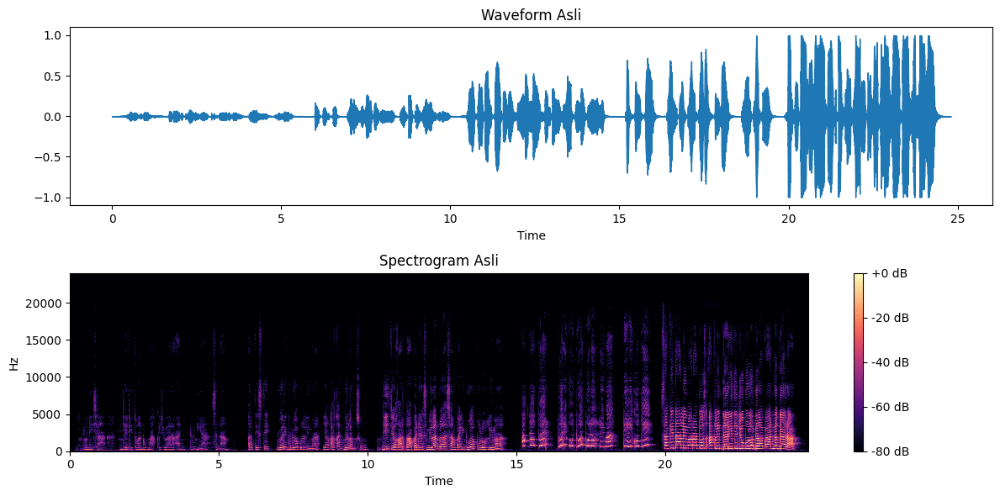

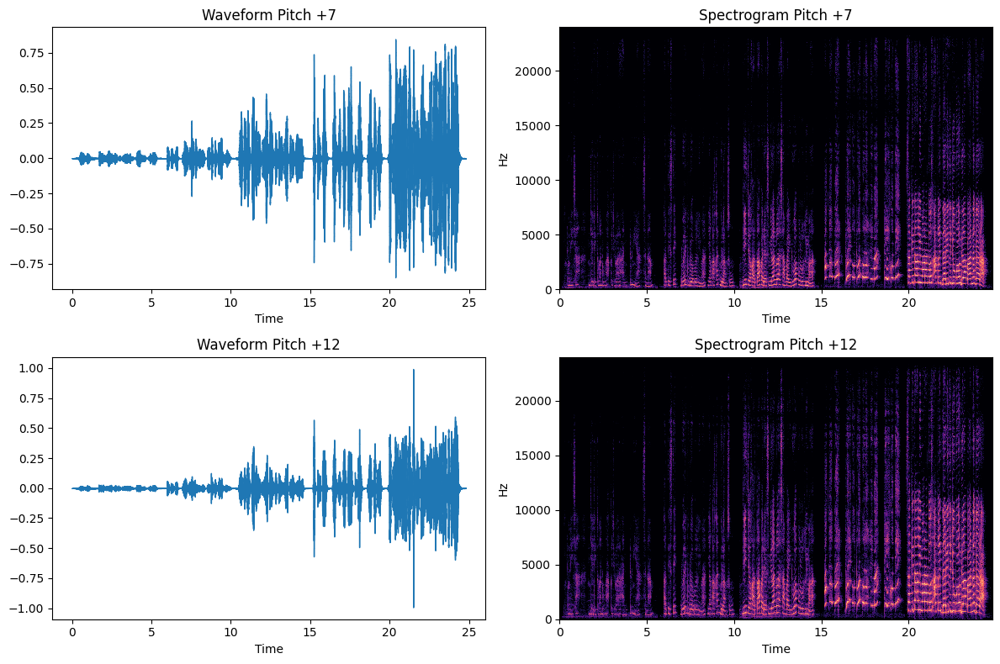

Audio Asli:


Pitch +7:


Pitch +12:


Gabungan (+7 dan +12):


In [3]:
# --- 1. Load Audio Asli ---
file_path = "../Data/Audio1.wav"  # ganti sesuai nama file audio kamu
y, sr = librosa.load(file_path, sr=None)
print(f"Durasi: {librosa.get_duration(y=y, sr=sr):.2f} detik | Sample Rate: {sr} Hz")

# --- 2. Visualisasi Waveform dan Spectrogram Asli ---
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title("Waveform Asli")

plt.subplot(2, 1, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz', cmap='magma')
plt.title("Spectrogram Asli")
plt.colorbar(format="%+2.0f dB")
plt.tight_layout()
plt.show()

# --- 3. Pitch Shifting ---
# pitch +7 dan +12
y_pitch7 = librosa.effects.pitch_shift(y, sr=sr, n_steps=7)
y_pitch12 = librosa.effects.pitch_shift(y, sr=sr, n_steps=12)

# --- 4. Simpan hasil pitch shifting ---
sf.write("Audio_Pitch7.wav", y_pitch7, sr)
sf.write("Audio_Pitch12.wav", y_pitch12, sr)

# --- 5. Visualisasi Hasil Pitch Shifting ---
fig, ax = plt.subplots(2, 2, figsize=(12, 8))

# Waveform pitch +7
librosa.display.waveshow(y_pitch7, sr=sr, ax=ax[0,0])
ax[0,0].set_title("Waveform Pitch +7")

# Spectrogram pitch +7
D7 = librosa.amplitude_to_db(np.abs(librosa.stft(y_pitch7)), ref=np.max)
librosa.display.specshow(D7, sr=sr, x_axis='time', y_axis='hz', ax=ax[0,1], cmap='magma')
ax[0,1].set_title("Spectrogram Pitch +7")

# Waveform pitch +12
librosa.display.waveshow(y_pitch12, sr=sr, ax=ax[1,0])
ax[1,0].set_title("Waveform Pitch +12")

# Spectrogram pitch +12
D12 = librosa.amplitude_to_db(np.abs(librosa.stft(y_pitch12)), ref=np.max)
librosa.display.specshow(D12, sr=sr, x_axis='time', y_axis='hz', ax=ax[1,1], cmap='magma')
ax[1,1].set_title("Spectrogram Pitch +12")

plt.tight_layout()
plt.show()

audio7 = AudioSegment.from_file("Audio_Pitch7.wav")
audio12 = AudioSegment.from_file("Audio_Pitch12.wav")
combined = audio7 + audio12  # gabung berurutan

combined.export("Audio_Chipmunk_Combined.wav", format="wav")

# --- 7. Putar hasil langsung di notebook ---
print("Audio Asli:")
display(Audio(file_path))

print("Pitch +7:")
display(Audio("Audio_Pitch7.wav"))

print("Pitch +12:")
display(Audio("Audio_Pitch12.wav"))

print("Gabungan (+7 dan +12):")
display(Audio("Audio_Chipmunk_Combined.wav"))

1. proses pitch shifting yang saya lakukan pada audio1.wav adalah menaikkan nada suara sehingga menghasilkan suara seperti chipmunk. prosesnya dilakukan menggunakan effect pitch shift di librosa dan menggunakan dua parameter pergeseran nada, pakai +7 dan +12 semitone.
perubahan pitch ini dilakukan tanpa mengubah durasi suaranya menggunakan metode phase vocoder, yang bekerja dengan cara menggeser frekuensi fundamental dan harmonik ke arah yang lebih tinggi. hasilnya pada pitch +7 suara saya terdengar lebih ringan dan nyaring tetapi masih natural, sedangkan pitch +12 suara saya terdengar jauh lebih tinggi dan lebih tipis menyerupai chipmunk.
2. parameter yang saya gunakan yaitu:
    y: sinyal audio input
    sr: sampel rate audio
    n_steps: jumlah pergeseran nada(Semitone), yaitu +7 dan +12
    metode yang digunakan adalah phase vocoder, berfungsi untuk mengubah frekuensi tanpa memengaruhi durasi suara.
3. perbedaan representasi visual pada wavefrom hasil pitch shifting adalah dia terlihat lebbih rapat karena frekuensinya meningkat. kemudian pada spectogram, energi suaranya bergeser le frekuensi yang lebih tinggi dan menunjukkan warna terang di bagian atasnya. berarti ini menunjukkan pitchnya meningkat daripada suara aslinya.
4. pengaruh terhadap kualitas dan kejernihan suara menggunakan pitch yaitu suaranya lebih nyaring dan tipis. pada pitch +7 dia masih cukup natural tapi pada pitch +12 suaranya menjadi seperti chipmunk, lebih tinggi lagi dan kurang jelas.